- Continued from data analysis part 3

## **Analysis of listing popularity**

Besides knowing the current market price, the new airbnb partners need to know of how to improve the popularity of their listing. This is crucial as popular listing get higher traffic and potentially attract more customers. To observe listing popularity, We are using number_of_reviews and number_of_reviews_ltm features as these reviews reflect customer feedbacks and interaction to the listing. The more feedback and interaction to the listing, the more popular listing is. To gain more insights of listing popularity, we have some questions that consist of:
* What is the most popular room type in airbnb Bangkok?
* What are the most popular neighbourhouds for airbnb listing in Bangkok which have the highest number of reviews? 
* What is the price range or price category that most popular or has the highest total reviews?


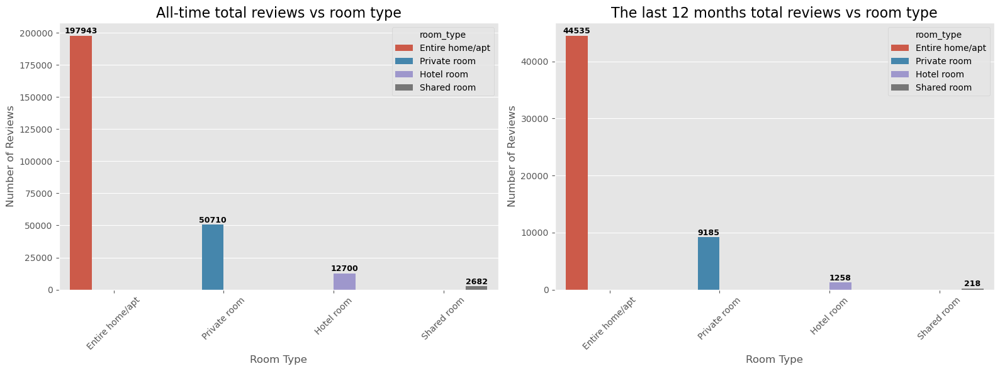

In [100]:
# The popularity of listing room types based on the number of reviews (last 12 months and all time reviews)
# Number of reviews vs room types

# Setting size and creating subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Creating bar plot for total reviews based on room types
ax1 = sns.barplot(data=df,
                  x='room_type',
                  y='number_of_reviews',
                  estimator=np.sum, 
                  hue='room_type',
                  ci=0,
                  ax=axes[0],
                  )

# Creating annotation function in bar for the first subplot
for bar in ax1.patches:
    height = bar.get_height()
    if height != 0:  # Memeriksa apakah nilai bar tidak nol sebelum menambahkan annotasi
        ax1.annotate(f'{height:.0f}',  
                    (bar.get_x() + bar.get_width() / 2., height),  
                    ha='center', va='center',  # Posisi teks anotasi (horizontal dan vertikal)
                    xytext=(0, 5),  # Jarak teks anotasi dari bar (horizontal, vertikal)
                    textcoords='offset points',  # Koordinat teks anotasi
                    fontsize=9,  # Ukuran font teks anotasi
                    color='black',  # Warna teks anotasi
                    fontweight='semibold'  # Ketebalan huruf teks anotasi
                    )

ax1.set_xlabel('Room Type')
ax1.set_ylabel('Number of Reviews')
ax1.set_title('All-time total reviews vs room type', fontsize=16)
ax1.tick_params(axis='x', rotation=45)  # Rotate x-axis labels for better readability

# Creating bar plot for number of reviews based on listing types in the last 12 months
ax2 = sns.barplot(data=df,
                  x='room_type',
                  y='number_of_reviews_ltm',
                  estimator=np.sum,
                  hue='room_type',
                  ci=0,
                  ax=axes[1],
                  )

# Creating annotation function in bar for the second subplot
for bar in ax2.patches:
    height = bar.get_height()
    if height != 0:  # Memeriksa apakah nilai bar tidak nol sebelum menambahkan annotasi
        ax2.annotate(f'{height:.0f}',  
                    (bar.get_x() + bar.get_width() / 2., height),  
                    ha='center', va='center',  # Posisi teks anotasi (horizontal dan vertikal)
                    xytext=(0, 5),  # Jarak teks anotasi dari bar (horizontal, vertikal)
                    textcoords='offset points',  # Koordinat teks anotasi
                    fontsize=9,  # Ukuran font teks anotasi
                    color='black',  # Warna teks anotasi
                    fontweight='semibold'  # Ketebalan huruf teks anotasi
                    )
    
ax2.set_xlabel('Room Type')
ax2.set_ylabel('Number of Reviews')
ax2.set_title('The last 12 months total reviews vs room type', fontsize=16)
ax2.tick_params(axis='x', rotation=45)  # Rotate x-axis labels for better readability

plt.tight_layout()
plt.show()


Entire home/apt is the most popular room type that has the highest number of review both in all-time reviews and the last 12 months

In [101]:
# Kruskal Wallis test for confirming there are significant differences number of reviews among room types
from scipy.stats import kruskal

stat, pvalue = kruskal(
    df[df['room_type'] == 'Entire home/apt']['number_of_reviews'],
    df[df['room_type'] == 'Private room']['number_of_reviews'],
    df[df['room_type'] == 'Hotel room']['number_of_reviews'],
    df[df['room_type'] == 'Shared room']['number_of_reviews']
)
pvalue


alpha = 0.05

if pvalue > alpha:
    print(f'''
    The result of kruskal wallis test: pvalue = {pvalue:.5f}. pvalue > {alpha}. We cannot reject the null hypothesis. There no is sufficient evidence to conclude 
    that there is a minimum of one room type which has number_of_reviews that significantly different to other room types.
    ''')
else:
    print(f'''
    The result of kruskal wallis test: pvalue = {pvalue:.5f}. pvalue <= {alpha}. We can reject the null hypothesis. There is sufficient evidence to conclude 
    that there is a minimum of one room type which has number_of_reviews that significantly different to other room types.  
    ''')


    The result of kruskal wallis test: pvalue = 0.00000. pvalue <= 0.05. We can reject the null hypothesis. There is sufficient evidence to conclude 
    that there is a minimum of one room type which has number_of_reviews that significantly different to other room types.  
    


In [102]:
# Kruskal Wallis test for confirming there are significant differences number of reviews among room types
from scipy.stats import kruskal

stat, pvalue = kruskal(
    df[df['room_type'] == 'Entire home/apt']['number_of_reviews_ltm'],
    df[df['room_type'] == 'Private room']['number_of_reviews_ltm'],
    df[df['room_type'] == 'Hotel room']['number_of_reviews_ltm'],
    df[df['room_type'] == 'Shared room']['number_of_reviews_ltm']
)
pvalue


alpha = 0.05

if pvalue > alpha:
    print(f'''
    The result of kruskal wallis test: pvalue = {pvalue:.5f}. pvalue > {alpha}. We cannot reject the null hypothesis. There no is sufficient evidence to conclude 
    that there is a minimum of one room type which has number_of_reviews_ltm that significantly different to other room types.
    ''')
else:
    print(f'''
    The result of kruskal wallis test: pvalue = {pvalue:.5f}. pvalue <= {alpha}. We can reject the null hypothesis. There is sufficient evidence to conclude 
    that there is a minimum of one room type which has number_of_reviews_ltm that significantly different to other room types.   
    ''')


    The result of kruskal wallis test: pvalue = 0.00000. pvalue <= 0.05. We can reject the null hypothesis. There is sufficient evidence to conclude 
    that there is a minimum of one room type which has number_of_reviews_ltm that significantly different to other room types.   
    


Based on the bar plot and statistical analysis above (pvalue<0.05), there is a significant different in number of reviews among room types. The trend is also similar between all time reviews and recent (last 12 months) reviews.  

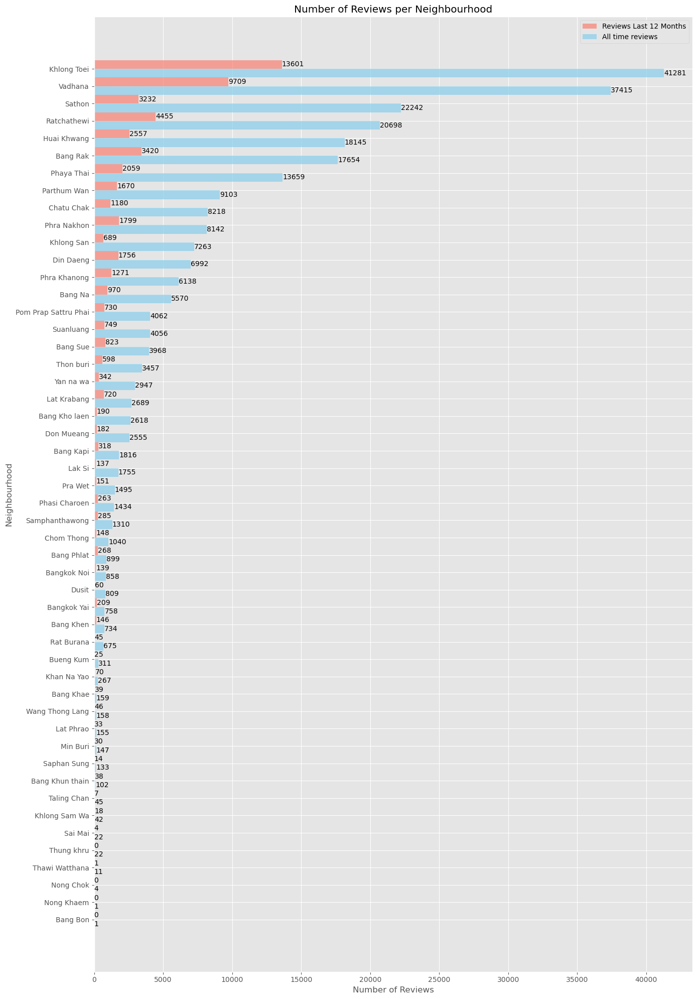

In [103]:
# Number of reviews vs neighbourhood locations

# Grouping by neighbourhood and summing the number_of_reviews and number_of_reviews_ltm
df_neighborhood_number_of_reviews = df.groupby('neighbourhood')[['number_of_reviews', 'number_of_reviews_ltm']].sum().sort_values(by='number_of_reviews', ascending=True).reset_index()

# Setting figure size
plt.figure(figsize=(14, 20))

# Define the width of each bar
bar_width = 0.5

# Calculate the positions for the bars
bar_positions = np.arange(len(df_neighborhood_number_of_reviews))

# Creating bar plot for number_of_reviews_ltm
plt.barh(bar_positions + bar_width/2, df_neighborhood_number_of_reviews['number_of_reviews_ltm'], bar_width, label='Reviews Last 12 Months', color='salmon', alpha=0.7)
# Creating bar plot for number_of_reviews
plt.barh(bar_positions - bar_width/2, df_neighborhood_number_of_reviews['number_of_reviews'], bar_width, label='All time reviews', color='skyblue', alpha=0.7)


# Adding annotations for number_of_reviews
for i, (index, row) in enumerate(df_neighborhood_number_of_reviews.iterrows()):
    plt.text(row['number_of_reviews'], i - bar_width/2, f"{row['number_of_reviews']}", va='center', fontsize=10)

# Adding annotations for number_of_reviews_ltm
for i, (index, row) in enumerate(df_neighborhood_number_of_reviews.iterrows()):
    plt.text(row['number_of_reviews_ltm'], i + bar_width/2, f"{row['number_of_reviews_ltm']}", va='center', fontsize=10)

plt.ylabel('Neighbourhood')
plt.xlabel('Number of Reviews')
plt.title('Number of Reviews per Neighbourhood')
plt.yticks(bar_positions, df_neighborhood_number_of_reviews['neighbourhood'])

# Adjust legend size and position
plt.legend()

plt.tight_layout()
plt.show()

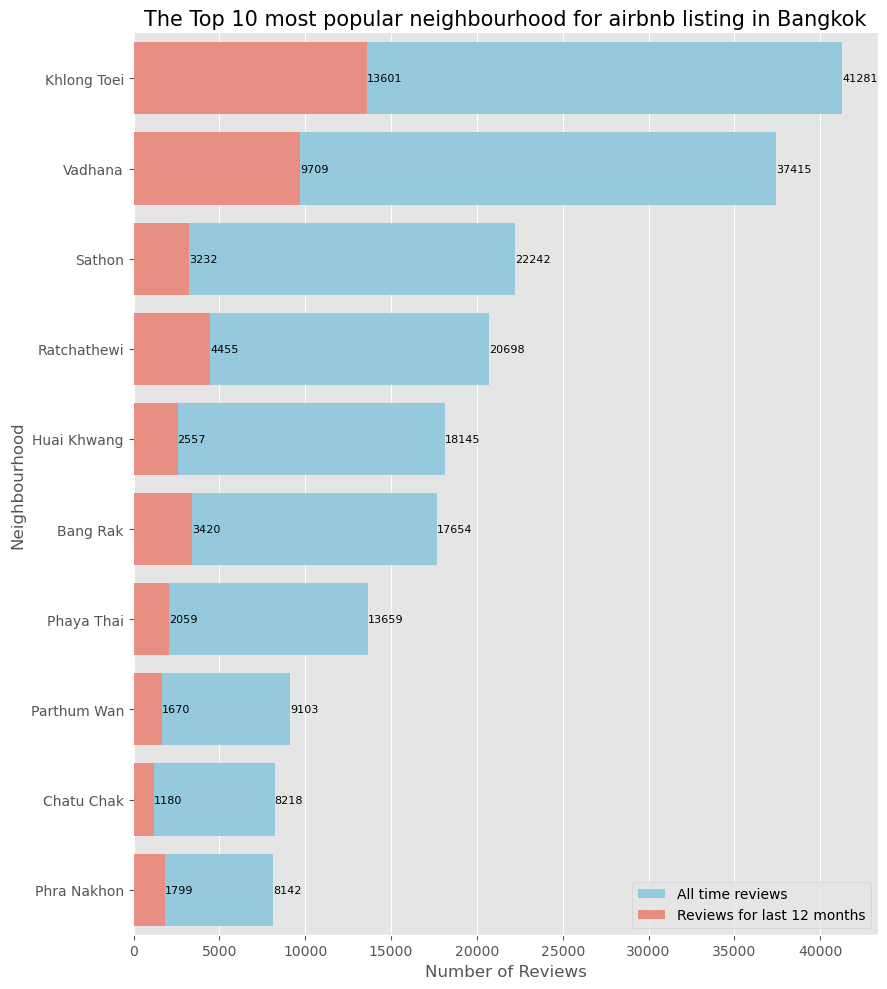

In [104]:
# The Top 10 most popular neighbourhood for airbnb listing in Bangkok

top_five = df_neighborhood_number_of_reviews.nlargest(10,'number_of_reviews') 
# Setting figure size
plt.figure(figsize=(9, 10))

# Creating a bar plot for number_of_reviews
sns.barplot(data=top_five, y='neighbourhood', x='number_of_reviews', ci=None, color='skyblue', label='All time reviews')

# Creating a bar plot for number_of_reviews_ltm
sns.barplot(data=top_five, y='neighbourhood', x='number_of_reviews_ltm', ci=None, color='salmon', label='Reviews for last 12 months')

# Adding annotations for number_of_reviews
for i, (index, row) in enumerate(top_five.iterrows()):
    plt.text(row['number_of_reviews'], i, f"{row['number_of_reviews']}", va='center', fontsize=8)

# Adding annotations for number_of_reviews_ltm
for i, (index, row) in enumerate(top_five.iterrows()):
    plt.text(row['number_of_reviews_ltm'], i, f"{row['number_of_reviews_ltm']}", va='center', fontsize=8)
    
    
# Adding labels and legends
plt.xlabel('Number of Reviews')
plt.ylabel('Neighbourhood')
plt.title('The Top 10 most popular neighbourhood for airbnb listing in Bangkok', fontsize=15)
plt.legend()

# Remove spines with seaborn
sns.despine(right=True, top=True, left=True)

# Displaying both bar plots
plt.tight_layout()
plt.show()

Based on all time reviews and recent review (last 12 months) data, Khlong Toei, Vadhana, Sathon, Ratchathewi, Huai Khwang, Bang Rak, Phaya Thai, Parthum Wan, Chatu chak, and Phra Nakhon are neighbourhood with the highest number of reviews.

**Neighbourhood with highest and lowest reviews on Bangkok map**

Now, we want to check the location of both neighbourhood with highest and lowest listing price on the Bangkok map using folium

In [105]:
# The neighbourhood with the highest and lowest price of reviews on Bangkok map 


# Creating Bangkok map with boundary
bangkok_map = folium.Map(
    location=[13.7563, 100.5018],
    zoom_start=12,
    tiles='https://cartodb-basemaps-{s}.global.ssl.fastly.net/light_all/{z}/{x}/{y}{r}.png',
    attr='Map data &copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors | Tiles &copy; <a href="https://carto.com/attributions">CARTO</a>',
    max_bounds=True,
    min_zoom=10, 
    max_bounds_viscosity=1.0,
    max_zoom=15,  
    max_bounds_readable=True  
)

# Coordinate boundary of Bangkok
bangkok_bounds = [[13.5, 100.25], [14.0, 100.9]]

# Adding map boundary as limitation for Bangkok area
folium.Rectangle(
    bounds=bangkok_bounds,
    fill=False,
    color='blue',
    weight=2,
    fill_opacity=0
).add_to(bangkok_map)

# Initiating MarkerCluster
listings = plugins.MarkerCluster().add_to(bangkok_map)

# Attaching marker to MarkerCluster
for lat, long, label in list(zip(df['latitude'], df['longitude'], df['room_type'])):
    folium.Marker(
        [lat, long],
        popup=label,
        icon=None
    ).add_to(listings)
    
# Adding markers for specific locations in Bangkok (red icon)
folium.Marker([13.7445, 100.4966], popup='Sukhumvit', icon=folium.Icon(icon='building', prefix='fa', color='red')).add_to(bangkok_map) # Most central area, Shopping centers, dining/restaurants, bars and many excellent accomodation. Near to BTS sky train.
folium.Marker([13.7233, 100.4762], popup='Siam', icon=folium.Icon(icon='building', prefix='fa', color='red')).add_to(bangkok_map) # Famous shopping malls (Siam Square and Central World), tourist attractions like Siam ocean World (aquarium), Madame Tusssaud's Wax museum. Near to BTS sky train
folium.Marker([13.7249, 100.493], popup='Silom', icon=folium.Icon(icon='building', prefix='fa', color='red')).add_to(bangkok_map) # Financial district, many bank headquarters, financial institutions & offices. Hundreds of restaurant and foodsthalls. Near MRT subway, BTS sky train.
folium.Marker([13.7314, 100.5148], popup='Ratchathewi', icon=folium.Icon(icon='building', prefix='fa', color='red')).add_to(bangkok_map) # Distric in central Bangkok, access to BTS skytrain, access to International airport (via Makkasan), Bangkok landmark 

# Adding markers for airports in Bangkok
folium.Marker([13.6902, 100.7501], popup='Suvarnabhumi Airport', icon=folium.Icon(icon='yellow', prefix='fa', color='orange')).add_to(bangkok_map) # airport
folium.Marker([13.9129, 100.6077], popup='Don Mueang', icon=folium.Icon(icon='yellow', prefix='fa', color='orange')).add_to(bangkok_map) # airport

# Add markers for specific locations in Bangkok with the highest number of reviews (orange icon)
folium.Marker([13.7080, 100.5839], icon=folium.Icon(color='orange'), popup='Khlong Toei').add_to(bangkok_map)
folium.Marker([13.7350, 100.5828], icon=folium.Icon(color='orange'), popup='Vadhana').add_to(bangkok_map)
folium.Marker([13.7083, 100.5265], icon=folium.Icon(color='orange'), popup='Sathon').add_to(bangkok_map)
folium.Marker([13.7314, 100.5148], icon=folium.Icon(color='orange'), popup='Ratchathewi').add_to(bangkok_map)
folium.Marker([13.7769, 100.5793], icon=folium.Icon(color='orange'), popup='Huai Khwang').add_to(bangkok_map) 
folium.Marker([13.7308, 100.5247], icon=folium.Icon(color='orange'), popup='Bang Rak').add_to(bangkok_map) 
folium.Marker([13.7470, 100.5347], icon=folium.Icon(color='orange'), popup='Phaya Thai').add_to(bangkok_map) 
folium.Marker([13.8036, 100.5537], icon=folium.Icon(color='orange'), popup='Chatuchak').add_to(bangkok_map) 
folium.Marker([13.7360, 100.5230], icon=folium.Icon(color='orange'), popup='Pathum Wan').add_to(bangkok_map) 
folium.Marker([13.7589, 100.5010], icon=folium.Icon(color='orange'), popup='Phra Nakhon').add_to(bangkok_map) 

# Add markers for specific locations in Bangkok with the lowest number of reviews (green icon)
folium.Marker([13.7043, 100.3485], icon=folium.Icon(color='green'), popup='Nong Khaem').add_to(bangkok_map)
folium.Marker([13.6584, 100.3998], icon=folium.Icon(color='green'), popup='Bang Bon').add_to(bangkok_map)
folium.Marker([13.8556, 100.7754], icon=folium.Icon(color='green'), popup='Nong Chok').add_to(bangkok_map)
folium.Marker([13.7984, 100.3529], icon=folium.Icon(color='green'), popup='Thawi Watthana').add_to(bangkok_map)
folium.Marker([13.6472, 100.4958], icon=folium.Icon(color='green'), popup='Thung Khru').add_to(bangkok_map) 
folium.Marker([13.9194, 100.6453], icon=folium.Icon(color='green'), popup='Sai Mai').add_to(bangkok_map)
folium.Marker([13.8592, 100.7041], icon=folium.Icon(color='green'), popup='Khlong Sam Wa').add_to(bangkok_map)
folium.Marker([13.7769, 100.3927], icon=folium.Icon(color='green'), popup='Taling Chan').add_to(bangkok_map)
folium.Marker([13.6756, 100.4868], icon=folium.Icon(color='green'), popup='Bang Khun Thain').add_to(bangkok_map)
folium.Marker([13.7807, 100.6790], icon=folium.Icon(color='green'), popup='Saphan Sung').add_to(bangkok_map)

# Displaying map
bangkok_map


Based on the map above, we can clearly see that the neighbourhoods with the highest number of reviews (orange icon) mostly located on the center of Bangkok, near to the shopping and tourism area (red icon). Oppositely, the neighbourhoods with lowest number of reviews (green icon) mostly located near the outer area of Bangkok. This probably can be explained as the number of reviews tends to proportionate with high number of listing available in the area. So, there might be a tendency of the higher number of listing in the area, the higher number of reviews as will be generated in the area as well. 

**The popular price ranges**

In order to know the popularity, we need to divide the listing price in Bangkok according to the class or price categories. There are some categories which commonly used for describing price range that consist of 'cheap', 'budget', 'economy', 'premium', and 'luxury'. Based on those knowledge, we are trying to divide all available listing prices and using quantiles (0.2, 0.4, 0.6, 0.8, 1) as price ranges for a price categories. Furthermore, We will classify each rows of airbnb bangkok listing dataframe (df) based on prices and put the classification in the new column named as 'price_category'. 

In [106]:
# Calculating prices based on quantiles
df['price'].describe(percentiles=[0.2, 0.4, 0.6, 0.8, 1.0]).to_frame()

,price
count,1.585300e+04
mean,3.217907e+03
std,2.497290e+04
min,2.780000e+02
20%,8.000000e+02
40%,1.200000e+03
50%,1.429000e+03
60%,1.690000e+03
80%,2.800000e+03
100%,1.100000e+06


Based on the calculation of quantile, we set the price category with price ranges as you can see on the table below
No | Price category |  Price range (in Thai Baht) |
|---|---|------------------------|
| 1 |**Cheap**     | =< 800|
| 2 |**Budget**   | 801 - 1200|
| 3 |**Economy**| 1201 - 1429|
| 4 |**Premium**| 1430 - 2800 |
| 5 |**Luxury**| > 2800|

In [107]:
# Defining and applying price category function to dataframe (df)
# Price category function
def airbnb_price_category(price):
    if price <= 800:
        return 'Cheap'
    if price > 800 and price <= 1200:
        return 'Budget'
    if price > 1200 and price <= 1429:
        return 'Economy'
    if price > 1429 and price <= 2800:
        return 'Premium'
    if price > 2800:
        return 'Luxury'

# Applying the price category function into column price and placing new column of price_category    
df['price_category'] = df['price'].apply(airbnb_price_category)

# Reviewingg some selected columns
df[['name','price','price_category']]
    

,name,price,price_category
0,Nice room with superb city view,1905,Premium
1,"Easy going landlord,easy place",1316,Economy
2,modern-style apartment in Bangkok,800,Cheap
3,Spacious one bedroom at The Kris Condo Bldg. 3,1286,Economy
4,Suite Room 3 at MetroPoint,1905,Premium
...,...,...,...
15848,素坤逸核心两房公寓42楼，靠近BTSon nut/无边天际泳池观赏曼谷夜景/出门当地美食街,2298,Premium
15849,Euro LuxuryHotel PratunamMKt TripleBdNrShoping...,1429,Economy
15850,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,1214,Economy
15851,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,1214,Economy


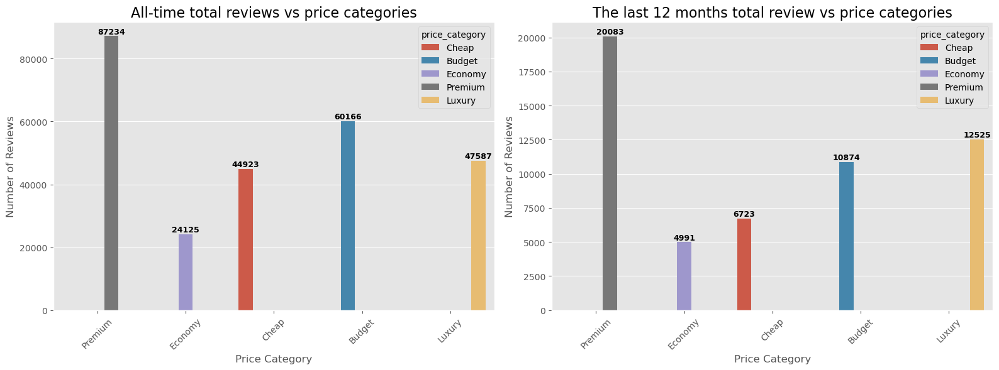

In [108]:
# Calculating total reviews based on price categories

# Number of reviews

# Setting size and creating subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Creating bar plot for total reviews based on room types
ax1 = sns.barplot(data=df,
                  x='price_category',
                  y='number_of_reviews',
                  estimator=np.sum, 
                  hue='price_category',
                  hue_order=['Cheap','Budget','Economy','Premium', 'Luxury'],
                  ci=0,
                  ax=axes[0])

# Creating annotation function in bar for the first subplot
for bar in ax1.patches:
    height = bar.get_height()
    if height != 0:  # Check if the bar height is not zero before adding annotation
        ax1.annotate(f'{height:.0f}',  
                    (bar.get_x() + bar.get_width() / 2., height),  
                    ha='center', va='center',  # Position of the annotation text (horizontal and vertical)
                    xytext=(0, 5),  # Offset of the annotation text from the bar (horizontal, vertical)
                    textcoords='offset points',  # Coordinate system of the annotation text
                    fontsize=9,  # Font size of the annotation text
                    color='black',  # Color of the annotation text
                    fontweight='semibold')  # Font weight of the annotation text
                    
# Adding labels and title
ax1.set_xlabel('Price Category')
ax1.set_ylabel('Number of Reviews')
ax1.set_title('All-time total reviews vs price categories', fontsize=16)
ax1.tick_params(axis='x', rotation=45)  # Rotate x-axis labels for better readability

# Creating bar plot for number of reviews based on listing types in the last 12 months
ax2 = sns.barplot(data=df,
                  x='price_category',
                  y='number_of_reviews_ltm',
                  estimator=np.sum,
                  hue='price_category',
                  hue_order=['Cheap','Budget','Economy','Premium', 'Luxury'],
                  ci=0,
                  ax=axes[1])

# Creating annotation function in bar for the second subplot
for bar in ax2.patches:
    height = bar.get_height()
    if height != 0:  # Check if the bar height is not zero before adding annotation
        ax2.annotate(f'{height:.0f}',  
                    (bar.get_x() + bar.get_width() / 2., height),  
                    ha='center', va='center',  # Position of the annotation text (horizontal and vertical)
                    xytext=(0, 5),  # Offset of the annotation text from the bar (horizontal, vertical)
                    textcoords='offset points',  # Coordinate system of the annotation text
                    fontsize=9,  # Font size of the annotation text
                    color='black',  # Color of the annotation text
                    fontweight='semibold')  # Font weight of the annotation text
                    
# Adding labels and title
ax2.set_xlabel('Price Category')
ax2.set_ylabel('Number of Reviews')
ax2.set_title('The last 12 months total review vs price categories', fontsize=16)
ax2.tick_params(axis='x', rotation=45)  # Rotate x-axis labels for better readability

plt.tight_layout()
plt.show()


Based on the bar chart above, premium category is the most popular price with the highest number of total reviews in all time and recent reviews. The other price categories have relatively similar trend between all time and recent reviews, except the budget and luxury categories who are switching the rank between 2nd and 3rd, vice versa.

In [109]:
# Kruskal Wallis test for confirming there are significant differences number of reviews among all-time number of reviews
from scipy.stats import kruskal

stat, pvalue = kruskal(
    df[df['price_category'] == 'Premium']['number_of_reviews'],
    df[df['price_category'] == 'Economy']['number_of_reviews'],
    df[df['price_category'] == 'Cheap']['number_of_reviews'],
    df[df['price_category'] == 'Budget']['number_of_reviews'],
    df[df['price_category'] == 'Luxury']['number_of_reviews']
)
pvalue


alpha = 0.05

if pvalue > alpha:
    print(f'''
    The result of kruskal wallis test: pvalue = {pvalue:.5f}. pvalue > {alpha}. We cannot reject the null hypothesis. There no is sufficient evidence to conclude 
    that there is a minimum of one room type which has number_of_reviews_ltm that significantly different to other price category
    ''')
else:
    print(f'''
    The result of kruskal wallis test: pvalue = {pvalue:.5f}. pvalue <= {alpha}. We can reject the null hypothesis. There is sufficient evidence to conclude 
    that there is a minimum of one room type which has number_of_reviews_ltm that significantly different to other price category   
    ''')


    The result of kruskal wallis test: pvalue = 0.00000. pvalue <= 0.05. We can reject the null hypothesis. There is sufficient evidence to conclude 
    that there is a minimum of one room type which has number_of_reviews_ltm that significantly different to other price category   
    


In [110]:
# Kruskal Wallis test for confirming there are significant differences number of reviews among recent (last 12 month) number of reviews
from scipy.stats import kruskal

stat, pvalue = kruskal(
    df[df['price_category'] == 'Premium']['number_of_reviews_ltm'],
    df[df['price_category'] == 'Economy']['number_of_reviews_ltm'],
    df[df['price_category'] == 'Cheap']['number_of_reviews_ltm'],
    df[df['price_category'] == 'Budget']['number_of_reviews_ltm'],
    df[df['price_category'] == 'Luxury']['number_of_reviews_ltm']
)
pvalue


alpha = 0.05

if pvalue > alpha:
    print(f'''
    The result of kruskal wallis test: pvalue = {pvalue:.5f}. pvalue > {alpha}. We cannot reject the null hypothesis. There no is sufficient evidence to conclude 
    that there is a minimum of one room type which has number_of_reviews_ltm that significantly different to other price category
    ''')
else:
    print(f'''
    The result of kruskal wallis test: pvalue = {pvalue:.5f}. pvalue <= {alpha}. We can reject the null hypothesis. There is sufficient evidence to conclude 
    that there is a minimum of one room type which has number_of_reviews_ltm that significantly different to other price category   
    ''')


    The result of kruskal wallis test: pvalue = 0.00000. pvalue <= 0.05. We can reject the null hypothesis. There is sufficient evidence to conclude 
    that there is a minimum of one room type which has number_of_reviews_ltm that significantly different to other price category   
    


In addition to that, both statistical test above (using kruskal wallis) resulting in pvalue <= 0.05 that indicate there is a significant different in number of reviews among price categories of all time and recent review data.

**The correlation of number of reviews with other features**

As getting higher number of reviews is important to the new host for attracting more customers, so we want to know what are other factors that may correlate to the popularity of listings. In order to do that, we conduct correlation analysis between variable 'number_of_reviews' and 'number_of_reviews_ltm' with other variables such as 'price', 'calculated_host_listings', 'availability_365', and 'minimum_night'.

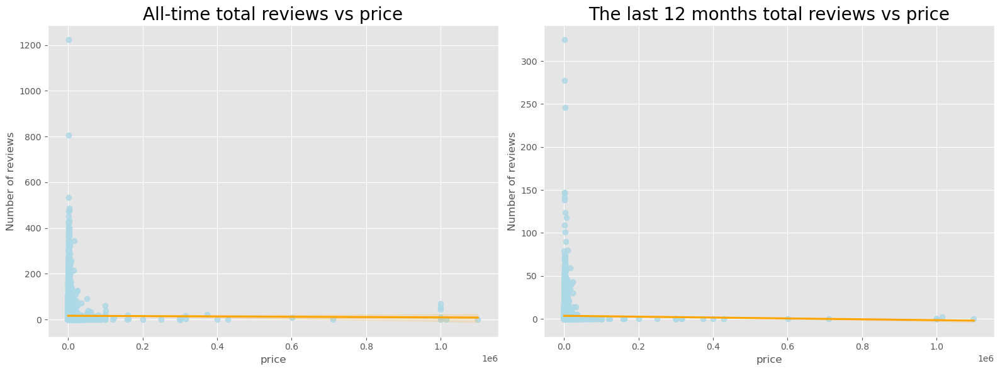

In [111]:
# Correlation of price vs total reviews (all time and recent)
# Scatter plot
# Setting size and creating subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Sub plot 1
# Creating scatter plot with regression line
ax1 = sns.regplot(data=df, 
                x='price', 
                y='number_of_reviews',
                scatter_kws={"color": "lightblue"},  # Set color of scatter plot dots
                line_kws={"color": "orange"},  # Set color of regression line
                ax=axes[0])

# Adding labels and title
ax1.set_title('All-time total reviews vs price', fontsize=20)
ax1.set_xlabel('price')
ax1.set_ylabel('Number of reviews')

# Sub plot 2
# Creating scatter plot with regression line
ax2 = sns.regplot(data=df, 
                x='price', 
                y='number_of_reviews_ltm',
                scatter_kws={"color": "lightblue"},  # Set color of scatter plot dots
                line_kws={"color": "orange"},  # Set color of regression line
                ax=axes[1])

# Adding labels and title
ax2.set_title('The last 12 months total reviews vs price', fontsize=20)
ax2.set_xlabel('price')
ax2.set_ylabel('Number of reviews')


# displaying the plots
plt.tight_layout()
plt.show()

In [112]:
# Correlation price vs total review
df[['price', 'number_of_reviews', 'number_of_reviews_ltm' ]].corr(method='spearman')

,price,number_of_reviews,number_of_reviews_ltm
price,1.000000,-0.020784,0.043644
number_of_reviews,-0.020784,1.000000,0.705398
number_of_reviews_ltm,0.043644,0.705398,1.000000


Based on the result of spearman analysis and scatter plot of 'price' with 'number_of_reviews' and 'number_of_reviews_ltm', we find that the feature of 'price' has very weak (negative) or almost no correlation with 'number_of_reviews' (rs =-0.02) and very weak correlation to the 'number_or_reviews_ltm' (rs = 0.04)

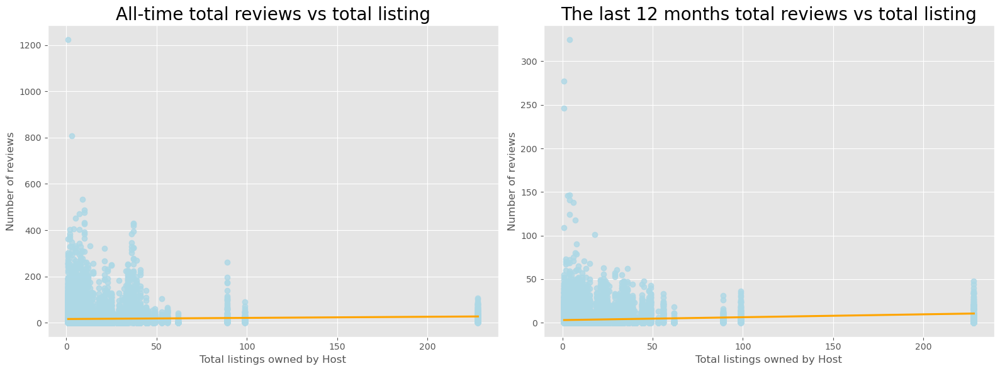

In [113]:
# Correlation of total listing vs total review (all time and recent)
# Setting size and creating subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Sub plot 1
# Creating scatter plot with regression line
ax1 = sns.regplot(data=df, 
                x='calculated_host_listings_count', 
                y='number_of_reviews',
                scatter_kws={"color": "lightblue"},  # Set color of scatter plot dots
                line_kws={"color": "orange"},  # Set color of regression line
                ax=axes[0])

# Adding labels and title
ax1.set_title('All-time total reviews vs total listing', fontsize=20)
ax1.set_xlabel('Total listings owned by Host')
ax1.set_ylabel('Number of reviews')

# Sub plot 2
# Creating scatter plot with regression line
ax2 = sns.regplot(data=df, 
                x='calculated_host_listings_count', 
                y='number_of_reviews_ltm',
                scatter_kws={"color": "lightblue"},  # Set color of scatter plot dots
                line_kws={"color": "orange"},  # Set color of regression line
                ax=axes[1])

# Adding labels and title
ax2.set_title('The last 12 months total reviews vs total listing', fontsize=20)
ax2.set_xlabel('Total listings owned by Host')
ax2.set_ylabel('Number of reviews')


# displaying the plots
plt.tight_layout()
plt.show()

In [114]:
# Correlation total listing vs total review
df[['calculated_host_listings_count', 'number_of_reviews', 'number_of_reviews_ltm']].corr(method='spearman')

,calculated_host_listings_count,number_of_reviews,number_of_reviews_ltm
calculated_host_listings_count,1.000000,0.221070,0.276417
number_of_reviews,0.221070,1.000000,0.705398
number_of_reviews_ltm,0.276417,0.705398,1.000000


Based on the result of spearman analysis and scatter plot of total listing owned by host or 'calculated_host_listing_count' feature with 'number_of_reviews' and 'number_of_reviews_ltm', we find that the 'calculated_host_listing_count' has weak correlation with both 'number_of_reviews'(rs = 0.221) and 'number_or_reviews_ltm' (rs = 0.276).

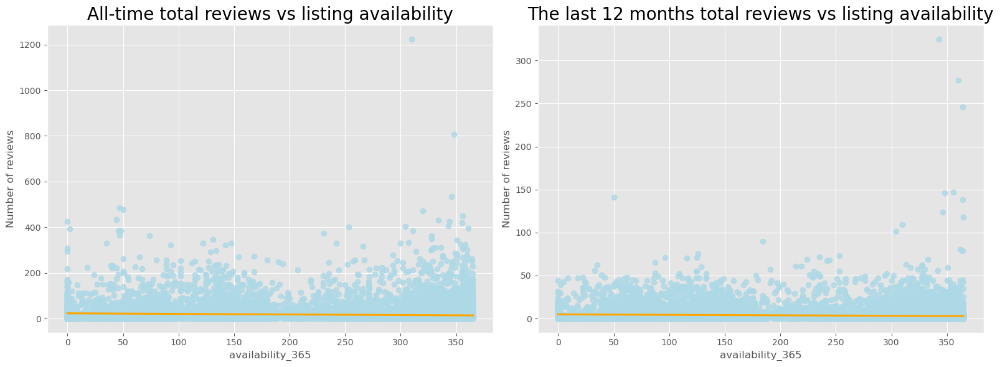

In [115]:
# Correlation of availability_365 vs total review (all time and recent)
# Setting size and creating subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Sub plot 1
# Creating scatter plot with regression line
ax1 = sns.regplot(data=df, 
                x='availability_365', 
                y='number_of_reviews',
                scatter_kws={"color": "lightblue"},  # Set color of scatter plot dots
                line_kws={"color": "orange"},  # Set color of regression line
                ax=axes[0])

# Adding labels and title
ax1.set_title('All-time total reviews vs listing availability', fontsize=20)
ax1.set_xlabel('availability_365')
ax1.set_ylabel('Number of reviews')

# Sub plot 2
# Creating scatter plot with regression line
ax2 = sns.regplot(data=df, 
                x='availability_365', 
                y='number_of_reviews_ltm',
                scatter_kws={"color": "lightblue"},  # Set color of scatter plot dots
                line_kws={"color": "orange"},  # Set color of regression line
                ax=axes[1])

# Adding labels and title
ax2.set_title('The last 12 months total reviews vs listing availability', fontsize=20)
ax2.set_xlabel('availability_365')
ax2.set_ylabel('Number of reviews')


# displaying the plots
plt.tight_layout()
plt.show()

In [116]:
# Correlation of listing availability vs total review
df[['availability_365', 'number_of_reviews', 'number_of_reviews_ltm']].corr(method='spearman')

,availability_365,number_of_reviews,number_of_reviews_ltm
availability_365,1.000000,-0.264195,-0.212985
number_of_reviews,-0.264195,1.000000,0.705398
number_of_reviews_ltm,-0.212985,0.705398,1.000000


Based on the result of spearman analysis and scatter plot of the number of days listing has been booked in the future or 'availability_365' feature with all time total reviews ('number_of_reviews') and recent 12 months ('number_of_reviews_ltm'), we find that the 'availability_365' has negative weak correlation with both 'number_of_reviews' (rs = -0.264) and 'number_or_reviews_ltm' (rs = -0.213).

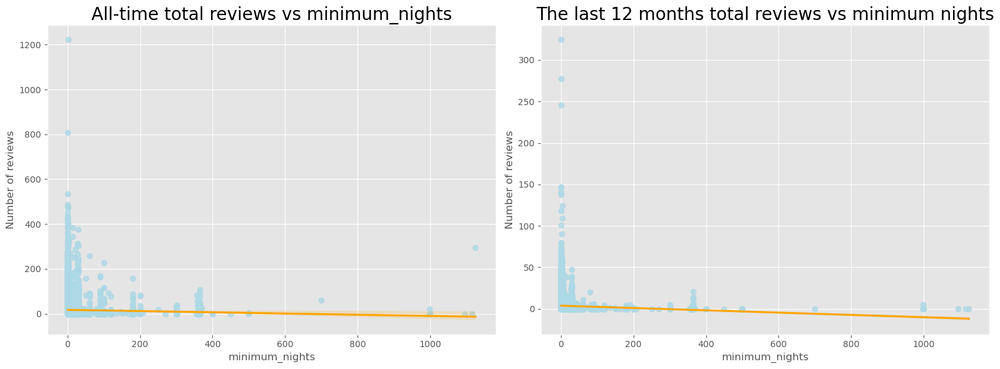

In [117]:
# Correlation of minimum_night vs total review (all time and recent)
# Setting size and creating subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Sub plot 1
# Creating scatter plot with regression line
ax1 = sns.regplot(data=df, 
                x='minimum_nights', 
                y='number_of_reviews',
                scatter_kws={"color": "lightblue"},  # Set color of scatter plot dots
                line_kws={"color": "orange"},  # Set color of regression line
                ax=axes[0])

# Adding labels and title
ax1.set_title('All-time total reviews vs minimum_nights', fontsize=20)
ax1.set_xlabel('minimum_nights')
ax1.set_ylabel('Number of reviews')

# Sub plot 2
# Creating scatter plot with regression line
ax2 = sns.regplot(data=df, 
                x='minimum_nights', 
                y='number_of_reviews_ltm',
                scatter_kws={"color": "lightblue"},  # Set color of scatter plot dots
                line_kws={"color": "orange"},  # Set color of regression line
                ax=axes[1])

# Adding labels and title
ax2.set_title('The last 12 months total reviews vs minimum nights', fontsize=20)
ax2.set_xlabel('minimum_nights')
ax2.set_ylabel('Number of reviews')


# displaying the plots
plt.tight_layout()
plt.show()

In [118]:
# Correlation of minimum night vs total reviews
df[['minimum_nights', 'number_of_reviews', 'number_of_reviews_ltm']].corr(method='spearman')

,minimum_nights,number_of_reviews,number_of_reviews_ltm
minimum_nights,1.000000,0.036257,0.012681
number_of_reviews,0.036257,1.000000,0.705398
number_of_reviews_ltm,0.012681,0.705398,1.000000


Based on the result of spearman analysis and scatter plot of the number of minimum night renting of accomodation or 'minimum_night' feature with all time total reviews ('number_of_reviews') and recent 12 months ('number_of_reviews_ltm'), we find that the 'minimum_night' has very weak correlation with 'number_of_reviews' (rs = 0.036) and very weak or almost no correlation to 'number_or_reviews_ltm' (rs = 0.01).

**Insights from listing popularity data analysis**

* Entire home/apt is the most popular room type that has the highest number of reviews both in all-time reviews and the last 12 months.
* Khlong Toei, Vadhana, Sathon, Ratchathewi, Huai Khwang, Bang Rak, Phaya Thai, Parthum Wan, Chatu chak, and Phra Nakhon are neighbourhood with the highest number of reviews.
* Premium category (price range between 1430 and 2800 Thai Baht) is the most popular price category with the highest number of total reviews in all time and recent reviews.

**More insights for the new airbnb partners**

* If partners has the resources, prioritize to organize and to manage the owned property for airbnb listing into entire home/apt room type as this type is generate more reviews.
* Maintain the price of listing under the range of premium category (between 1430 and 2800 Thai Baht), as this price category is the most popular.

## **Analysis of Listing promotional language: English vs non-English**

Analysis of listing promotional language is conducted to find more information of which language should be used for listing descriptions and marketing purpose. By separating listing description in English and Non-English, we can compare them and find more insights. To gain insights, we have some questions that consist of: 
* What is the current proportion of listings that use English and listings that use Non-English as promotional language in the airbnb Bangkok?
* Which listings are more popular, listings that use English as promotional language or not, based on all time and recent (last 12 months) total reviews?
* Which listings are higher in price, listings that use English as promotional language or not?


**Preparation for analysis**

To separate English and non-English word, we need to import additional libray such as regex (re), string, and emoji. These library will help us in filtering words and excluding symbols that will hinder the analysis. We also add new colums to the dataframe (df) such as 'name_without_emoji' and 'listing_in_english'. 

'name_without_emoji' contains 'name' column that has been treated with 'remove_emoji' (takes a text input and removes all emojis from it) and 'remove_symbols' functions (takes a text input and removes emojis and other symbols using regex).

'listing_in_english' contains 'name_without_emoji' column that has been treated with 'contains_only_english_words(input_string)' that checks if the input string contains only English words, alphanumeric characters, and symbols from the string module. It uses a regular expression pattern to match English words, alphanumeric characters, and punctuation.

In [119]:
# Preparation for analysis
# Importing additional libraries
import re
import string
import emoji

# Deleting emojis in listing 'name'
def remove_emojis(text):
    return ''.join(c for c in text if (emoji.is_emoji(c) == False))

# Deleting symbols in listing 'name'
def remove_symbols(text):
    emoji_pattern = re.compile(pattern="["
                                     u"\U0001F600-\U0001F64F"  # Emojis in the Miscellaneous Symbols and Faces range (like smiley faces, thumbs up, etc.)
                                     u"\U0001F300-\U0001F5FF"  # Emojis in the Miscellaneous Symbols range (such as arrows, geometric shapes, and other graphical symbols)
                                     u"\U0001F680-\U0001F6FF"  # Emojis in the Transport and Map Symbols range (such as cars, trains, planes, etc.)
                                     u"\U0001F700-\U0001F77F"  # Emojis in the Alchemical Symbols range (related to alchemy and chemistry)
                                     u"\u2600-\u26FF"  # Emoji in the Miscellaneous Symbols range (weather symbols, astrological signs, etc.)
                                     u"\u2700-\u27BF"  # Emoji in Dingbats and Miscellaneous Symbols range (such as arrows, stars, bullets, etc.)
                                     u"\u25A0-\u25FF" # Emoji in Geometric Shapes range (various geometric shapes such as squares, circles, triangles, etc.)
                                     u"\u1D10-\u1D1F" # Emoji in Musical Symbols range (various musical symbols such as notes, clefs, etc.)
                                     u"\u2460-\u24FF" # Emoji in the Enclosed Alphanumeric range (It includes circled numbers, letters, etc.)
                                     "]+", flags=re.UNICODE) # to specify that Unicode matching should be used, allowing the pattern to match Unicode characters correctly.
    return emoji_pattern.sub(r'', text)

# To check if the listing name only contains English words
def contains_only_english_words(input_string):
    pattern = r'^[a-zA-Z0-9\s' + re.escape(string.punctuation) + ']+$'
    return re.match(pattern, input_string) is not None

# Creating new column that contains no emojis or symbols
df['name_without_emoji'] = df['name'].apply(remove_emojis)
df['name_without_emoji'] = df['name_without_emoji'].apply(remove_symbols)

# From the new column, determine whether the name contains only alphanumeric and symbol characters.
df['listing_in_english'] = df['name_without_emoji'].apply(contains_only_english_words)
df['listing_in_english'] = np.where(df['listing_in_english'], 'Yes', 'No')

# Displaying some selected columns
df[['name', 'name_without_emoji', 'listing_in_english']]

,name,name_without_emoji,listing_in_english
0,Nice room with superb city view,Nice room with superb city view,Yes
1,"Easy going landlord,easy place","Easy going landlord,easy place",Yes
2,modern-style apartment in Bangkok,modern-style apartment in Bangkok,Yes
3,Spacious one bedroom at The Kris Condo Bldg. 3,Spacious one bedroom at The Kris Condo Bldg. 3,Yes
4,Suite Room 3 at MetroPoint,Suite Room 3 at MetroPoint,Yes
...,...,...,...
15848,素坤逸核心两房公寓42楼，靠近BTSon nut/无边天际泳池观赏曼谷夜景/出门当地美食街,素坤逸核心两房公寓42楼，靠近BTSon nut/无边天际泳池观赏曼谷夜景/出门当地美食街,No
15849,Euro LuxuryHotel PratunamMKt TripleBdNrShoping...,Euro LuxuryHotel PratunamMKt TripleBdNrShoping...,Yes
15850,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,Yes
15851,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,Yes


We have added new columns of 'name_without_emoji' and 'listing_in_english' to the dataframe. Now we want to calculate the number of listing that use English and Non-English and visualize the data. 

**Comparison of total listing numbers in English and Non-English**

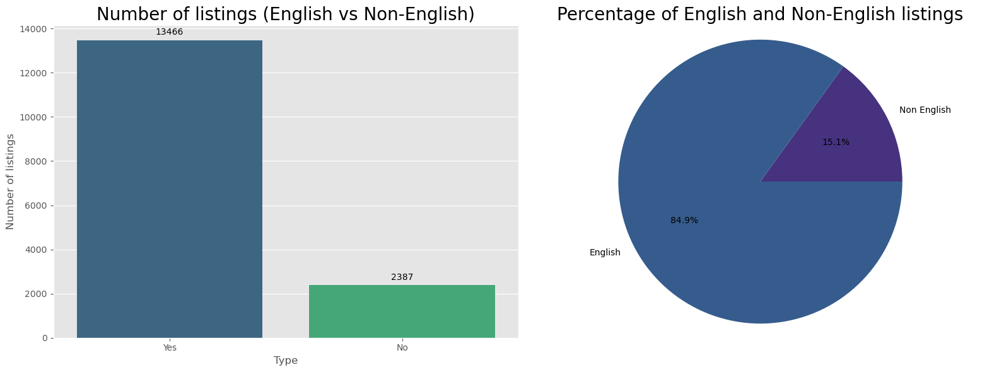

In [120]:
# Comparison of number and percentage of listing promotional languages (English vs Non-English)

# Create subplots & Setting size of figure
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plotting bar plot
sns.countplot(x='listing_in_english', data=df, palette='viridis', ax=axes[0])
axes[0].set_title('Number of listings (English vs Non-English)', fontsize=20)
axes[0].set_xlabel('Type', fontsize=12)
axes[0].set_ylabel('Number of listings')

# Function to annotate bars
def annotate_bars(ax):
    for p in ax.patches:
        ax.annotate(format(p.get_height(), '.0f'), 
                     (p.get_x() + p.get_width() / 2., p.get_height()), 
                     ha = 'center', va = 'center', 
                     xytext = (0, 9), 
                     textcoords = 'offset points')
# Annotate bars in the first subplot
annotate_bars(axes[0])

# Pie chart percentage of English and Non-English listing
# Plotting pie chart
axes[1].pie(df.groupby('listing_in_english')['name'].count(), labels=['Non English','English'], autopct='%1.1f%%', startangle=0, colors=sns.color_palette('viridis'));

# Adding title
axes[1].set_title('Percentage of English and Non-English listings', fontsize=20)
axes[1].axis('equal')

# Displaying the plots
plt.tight_layout()
plt.show()

Based on the bar plot and pie chart above, the number of listing that use English as promotional language is about five times higher than the listing that use language other than English. This indicates that the majority of current airbnb providers try to aim for international tourist market. 

**Popularity comparison between listing in English and Non-English**

By using total review features from DF such as 'number_of_reviews' and 'number_of_reviews_ltm', we want to compare which listing promotional language (English vs Non-English) that more popular being reviewed. 

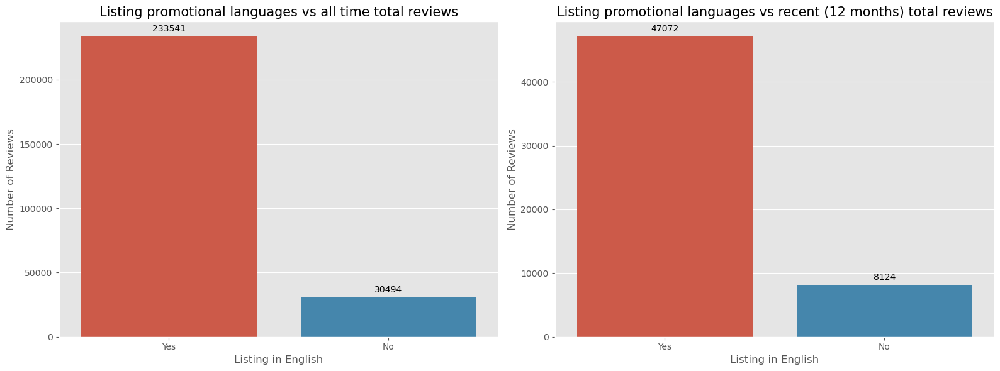

In [129]:
# Popularity comparison between listing in English and Non-English
# Create subplots & Setting size of figure
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Function to annotate bars
def annotate_bars(ax):
    for p in ax.patches:
        ax.annotate(format(p.get_height(), '.0f'), 
                     (p.get_x() + p.get_width() / 2., p.get_height()), 
                     ha = 'center', va = 'center', 
                     xytext = (0, 9), 
                     textcoords = 'offset points')

# Plotting bar plot of all-time total reviews vs listing promotional language (English vs non-English)
axes[0] = sns.barplot(data=df, 
            x='listing_in_english', 
            y='number_of_reviews',
            estimator=np.sum,
            errorbar=('ci',0),
            ax=axes[0])
axes[0].set_xlabel('Listing in English')
axes[0].set_ylabel('Number of Reviews')
axes[0].set_title('Listing promotional languages vs all time total reviews', fontsize=15)

# Plotting bar plot of recent (last 12 months) total reviews vs listing promotional language (English vs non-English)
axes[1] = sns.barplot(data=df, 
            x='listing_in_english', 
            y='number_of_reviews_ltm',
            estimator=np.sum,
            errorbar=('ci',0),
            ax=axes[1])
axes[1].set_xlabel('Listing in English')
axes[1].set_ylabel('Number of Reviews')
axes[1].set_title('Listing promotional languages vs recent (12 months) total reviews', fontsize=15);

# Annotating
annotate_bars(axes[0])
annotate_bars(axes[1])

# Displaying graph
plt.tight_layout()
plt.show()

Based on the bar chart above, we can see that the number of reviews of listing in English is higher than non English. We can also see that there is no different in trend between all time reviews and recent (last 12 months) reviews. 

In [122]:
# Statistical test of popularity comparison between listing promotional languages (English vs Non-English) of all time review

# Import library for mannwhitneyu
from scipy.stats import mannwhitneyu

# Extract review numbers for English and non-English listings
reviews_english = df[df['listing_in_english']=='Yes']["number_of_reviews"]
reviews_non_english = df[df['listing_in_english']=='No']["number_of_reviews"]

# Perform the Mann-Whitney U test
stat, p_value = mannwhitneyu(reviews_english, reviews_non_english, alternative="two-sided")

# Interpret the results
alpha = 0.05
print(f'p_value = {p_value}.')
if p_value < alpha:
    print("Since p_value < 0.05, we reject the null hypothesis: There is a significant difference of number of review between distributions.")
else:
    print("Since p_value > 0.05, we fail to reject the null hypothesis: There is no significant difference of number of review between distributions.")

p_value = 4.523001969630108e-06.
Since p_value < 0.05, we reject the null hypothesis: There is a significant difference of number of review between distributions.


In [130]:
# Statistical test of popularity comparison between listing promotional languages (English vs Non-English) of recent (last 12 months) review

# Import library for mannwhitneyu
from scipy.stats import mannwhitneyu

# Extract review numbers for English and non-English listings
reviews_english = df[df['listing_in_english']=='Yes']["number_of_reviews"]
reviews_non_english = df[df['listing_in_english']=='No']["number_of_reviews"]

# Perform the Mann-Whitney U test
stat, p_value = mannwhitneyu(reviews_english, reviews_non_english, alternative="two-sided")

# Interpret the results
alpha = 0.05
print(f'p_value = {p_value}.')
if p_value < alpha:
    print("Since p_value < 0.05, we reject the null hypothesis: There is a significant difference of number of review between distributions.")
else:
    print("Since p_value > 0.05, we fail to reject the null hypothesis: There is no significant difference of number of review between distributions.")

p_value = 4.523001969630108e-06.
Since p_value < 0.05, we reject the null hypothesis: There is a significant difference of number of review between distributions.


Based on the bar chart and statistical analysis above of total review comparison, we can conclude that listing which use English as promotional languange is significantly higher in number of reviews or more popular than the listing which use Non-English for listing description.

**Price comparison between listing in English and Non-English**



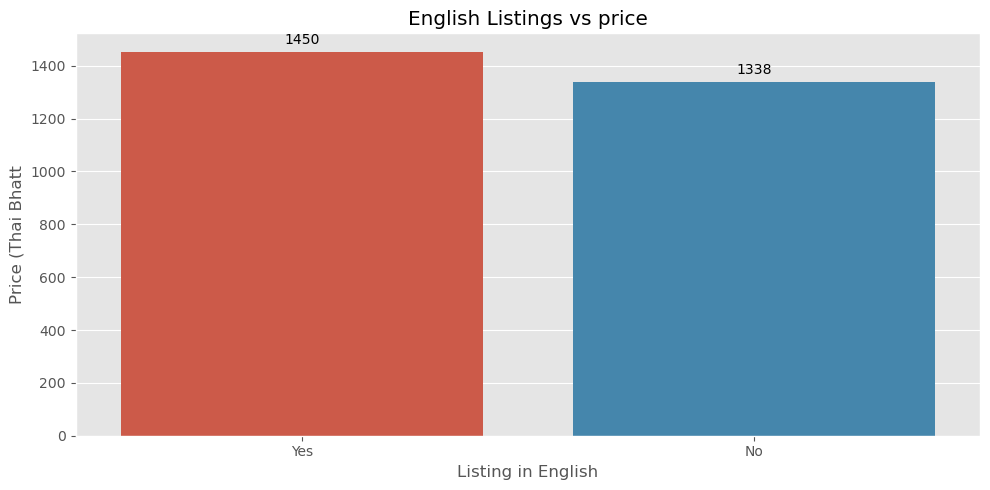

In [123]:
# Listing price based on listing promotional languages (English vs Non-English)

# Create subplots & Setting size of figure
fig, axes = plt.subplots(figsize=(10, 5))

# Plotting bar plot of price vs listing promotional language (English vs non-English)
ax = sns.barplot(data=df, 
            x='listing_in_english', 
            y='price', 
            estimator=np.median, 
            errorbar=('ci',0), 
            ax=axes)

# Function to annotate bars
def annotate_bars(ax):
    for p in ax.patches:
        ax.annotate(format(p.get_height(), '.0f'), 
                     (p.get_x() + p.get_width() / 2., p.get_height()), 
                     ha = 'center', va = 'center', 
                     xytext = (0, 9), 
                     textcoords = 'offset points')

# Annotating        
annotate_bars(ax)

# Adding labels and title
ax.set_xlabel('Listing in English')
ax.set_ylabel('Price (Thai Bhatt')
ax.set_title('English Listings vs price')

# Displaying charts
plt.tight_layout()
plt.show()


In [124]:
# Statistical test of price comparison between listing promotional languages (English vs Non-English)

# Import library for mannwhitneyu
from scipy.stats import mannwhitneyu

# Extract review numbers for English and non-English listings
reviews_english = df[df['listing_in_english'] == 'Yes']['price']
reviews_non_english = df[df['listing_in_english'] == 'No']['price']

# Perform the Mann-Whitney U test
stat, p_value = mannwhitneyu(reviews_english, reviews_non_english, alternative="two-sided")

# Interpret the results
alpha = 0.05
print(f'p_value = {p_value}.')
if p_value < alpha:
    print("Since p_value < 0.05, we reject the null hypothesis: There is a significant difference between distributions.")
else:
    print("Since p_value > 0.05, we fail to reject the null hypothesis: There is no significant difference between distributions.")


p_value = 9.633282119485812e-05.
Since p_value < 0.05, we reject the null hypothesis: There is a significant difference between distributions.


According to bar chart and statistical analysis above, we can see that there is a significant different of price between listing that uses English and Non-English. This probably indicates that by using English for promotional languange, we can attract more international tourists which can afford higher price of listing. 

**Insights of listing promotional language analysis**

* In the current dataset, the number of listing in English is five times higher than the Non-English listing.
* Listings that use English for listing description is significantly higher in number of reviews or more popular than the listing which use Non-English languages for promotion.
* Listings that use English for promotional language is signifcantly higher in price than the Non-English listing.



## **Analysis of the most frequent words or terms in listing description**

Beside knowing of which language to use for promotion, we need to find the words that match and describe accurately the listing amenities, public facilities, and attraction near the listings. This analysis is conducted to know what is the most frequent words that have been used before and might be used for future inspration in formulating effective listing description, terms, and hashtag that can be use for marketing purpose. Because of that, the question that we have for this analysis can be as:

* What are the top 20 most frequent words or terms used in listing description from the current airbnb Bangkok dataset?

**Preparation of analysis**

We will use the last column of 'name_without_emoji' from dataset which provide listing description (similar with 'name' column) but contains no symbols. We will also only select the listing that use English.

In [125]:
# Analyzing the words used by hosts when naming their listings
# getting list of all names
names = df[df['listing_in_english'] == 'Yes']['name_without_emoji'].tolist() # Placing all listing str into list 'names'
name_words = []
not_included_words = ['in', 'to', 'the', 'and', 'with', 'of', 'for', 'at']

# Loop through each name in the list of names
for name in names:
    name = str(name).split()
    # Iterate through each word
    for word in name:
        # Check if the word contains any alphabets
        if word not in not_included_words and any(char.isalpha() for char in word):
            # Append the word to name_words if it contains alphabets
            name_words.append(word.lower())

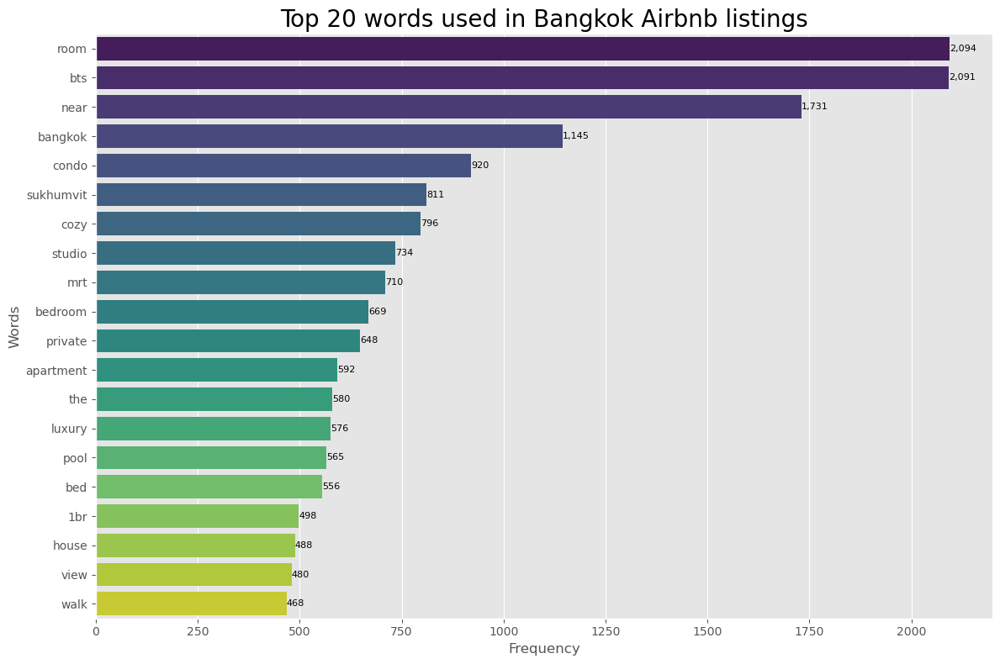

In [132]:
# Top 20 words used in Bangkok Airbnb listings
from collections import Counter  # to count words in our list

# plotting top 20 words used by the host in naming their home
words_count = Counter(name_words).most_common()
words_count = words_count[:20]

# converting the data into a dataframe so we can plot it by using Seaborn
df_words = pd.DataFrame(words_count)

# renaming columns
df_words.rename(columns={0: 'words', 1: 'frequency'}, inplace=True)

# Creating a bar plot of df_words (switching x and y variables)
plt.figure(figsize=(12, 8))
ax = sns.barplot(data=df_words, x='frequency', y='words', ci=None, palette='viridis')

#  Function for annotating bar chart
def annotate_bars(ax):
    for bar in ax.patches:
        x, y = bar.get_width(), bar.get_y() + bar.get_height() / 2
        ax.text(
            x, y, f'{bar.get_width():,.0f}', 
            va='center', 
            ha='left', 
            color='black', 
            fontsize=8)
    return ax


# Annotate bars in the plot
annotate_bars(ax)

# Adding labels and title
plt.xlabel('Frequency')
plt.ylabel('Words')
plt.title('Top 20 words used in Bangkok Airbnb listings', fontsize=20)
plt.tight_layout()
plt.show()


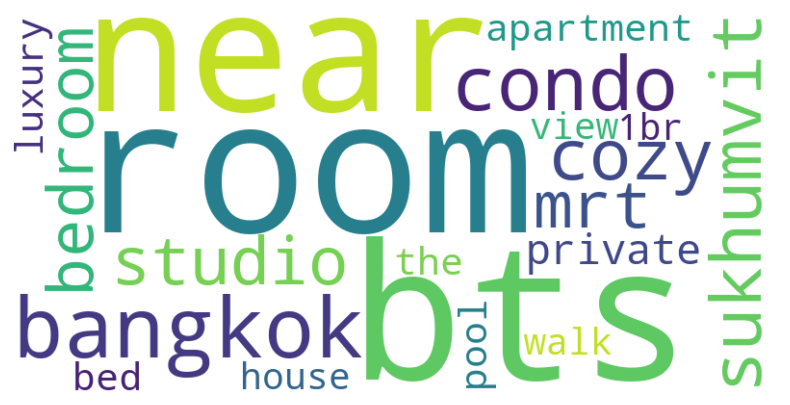

In [133]:
from wordcloud import WordCloud
word_freq = dict(zip(df_words['words'], df_words['frequency']))

# Generate the word cloud:
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)

# Display the word cloud:
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()


**Insights of the most frequent words in listing description**

According to the result of analysis, we have obtained the top 20 words which are the most common used in the listing description that consist of:
room, bts, near, condo, sukhumvit, cozy, studio, mrt, bedroom, private, apartment, luxury, pool, bed, 1br, house, view, walk.

Based on the result, we can see that the current listing providers try to highlight 3 major things that consist of 

* Room types & listing facilities : room, condo, studio, apartment, 1br, bed, and house 
* Nearby attraction & access: sukhumvit, bts, mrt, walk, and near 
* State/situation of comfort: cozy, private, luxury, and view

# **Insights and Key Recommendations**

* There are some neighbourhoods in Bangkok that have high density of listings and there are some neighbourhoods that have high listing competition. The locations of neighbourhood with high density of listing mostly near to center of Bangkok or near the tourism attraction. Interstingly, some neighbourhoods that have the highest price of listing and generate the highest number of reviews, also located in the center of Bangkok, near to the tourism attraction. This indicate that location have roles affecting price and number of reviews. Beside that, the room type is also associated with the neighbourhood locations based on chi square test.
* The new listing providers need to be aware about the intensity of listing competition in their own neighbourhood. In the highly competitive locations, the new listing providers  as the new entrant need to find their own additional uniqueness (based on amenities or probably add more services) that can be promoted  in the listing description and use it as competitive advantage  to attract customers.
* If the new listing provide have the resources, consider to organize the listing into entire home/apt as this room type has highest number of reviews.
* The new listing providers need to consider in registering their listing in the price category of premium as this category has the highest number of reviews in the recent and all time.
* Considering to use English for listing promotional instructions as this has a tendency to aim of higher price and generate more reviews. However, the listing provider can also use the Non-English language instructions (such as Thai and mandarin), if they want to attract the specific language user or targeting niche market.
* In formulating listing description, consider highlighting the nearby major attraction and access as selling point (e.g., Sukhumvit, BTS, walk, near), providing accurate description of room type and listing facilities (e.g., room, condo, studio, apartment, bed, house), and adding the element of comfort (e.g., Cozy, private, luxury)


# **References**

[1] [Airbnb - About us](https://news.airbnb.com/about-us/)

[2] [Japan leads the way and Thailand in Top 10: Airbnb’s fastest growing countries in 2024](https://www.traveldailynews.asia/statistics-trends/japan-leads-the-way-and-thailand-in-top-10-airbnbs-fastest-growing-countries/)

[3] [Travel revival robust: Bangkok fith on global trend list in 2023, says Airbnb](https://www.bangkokpost.com/business/general/2546691/travel-revival-robust)

[4] [tripadvisor.com](https://www.tripadvisor.com/ShowTopic-g293916-i3687-k6444296-Where_is_Bangkok_s_central-Bangkok.html)

[5] [freedomdestinations.co.uk](https://freedomdestinations.co.uk/blog/where-to-stay-in-bangkok#:~:text=Sukhumvit%20is%20the%20most%20central,to%20enjoy%20the%20bustling%20city)
